# MIT-BIH Normal Sinus Rhythm and Arrhythmia Database

In pandemic times, there is a need for data that is publicly available online. Researching, we found a resource called *Physionet* [1], where there is an extensive archive of digitalized physiologic signals. In particular, it has electrocardiogram recordings. We were interested in two: *MIT-BIH Normal Sinus Rhythm Database* and *MIT-BIH Arrhythmia Database* [2]. The data is available respectively on: https://physionet.org/content/nsrdb/1.0.0/ and https://physionet.org/content/mitdb/1.0.0/.

The *Physionet* database is a resource of ample influence. For example, the following articles have used in their research one of their databases [3-8]. In particular, the *MIT-BIH Normal Sinus Rhythm Database* has been used in various articles [9-12]. The *MIT-BIH Arrhythmia Database* is not left behind because it has been applied by [13-15].

When trying to extract the data from the .dat files from these two databases, we had problems. This pushed us to look deeper into a package developed by the MIT for processing the signals. It is called ``wfdb`` and it is available on: https://github.com/MIT-LCP/wfdb-python and https://archive.physionet.org/physiotools/wfdb.shtml#library. Even though it has a thorough documentation (see https://wfdb.readthedocs.io/en/latest/wfdb.html), a lack of examples is dicouraging.

The objective of this notebook is for it to be a clearer guide on extracting the data from this database.
The present notebook is based on the only demonstration notebook of the wfdb package. It is publicly available on: https://github.com/MIT-LCP/wfdb-python/blob/master/demo.ipynb.

In [1]:
# command to view figures in Jupyter notebook
%matplotlib inline 
from IPython.display import display

import wfdb 
import os
# import plotting modules and settings
import matplotlib.pyplot as plt 
import numpy as np

# commands to create high-resolution figures with large labels
%config InlineBackend.figure_formats = {'png', 'retina'} 
plt.rcParams['axes.labelsize'] = 18 # fontsize for figure labels
plt.rcParams['axes.titlesize'] = 20 # fontsize for figure titles
plt.rcParams['font.size'] = 16 # fontsize for figure numbers
plt.rcParams['lines.linewidth'] = 1.2 # line width for plotting

# Normal sinus rythm database

### Reading the data and saving the annotations

``sampto`` refers to the size of the time window

In [2]:
record = wfdb.rdrecord('16265', sampto = 15000)
annotation = wfdb.rdann('16265', 'atr', sampto = 15000)

The function ``plot_wfdb`` is used fot plotting the recording and extracting the R peaks from the signal (red crosses). As you can observe below, in this recording, the R extraction is not particularly good.

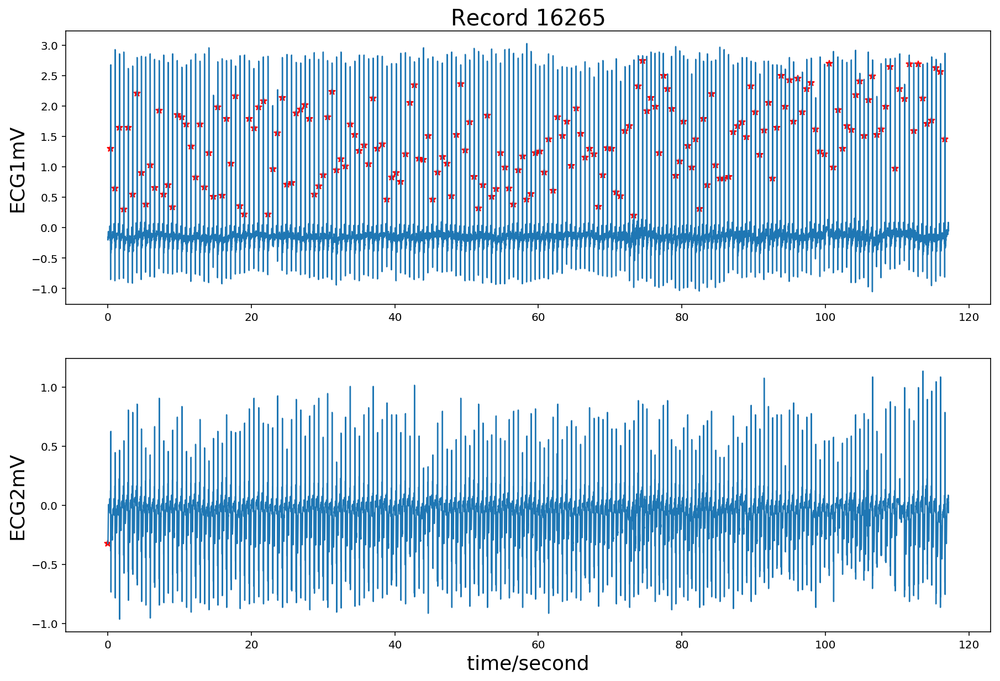

{'record_name': '16265',
 'n_sig': 2,
 'fs': 128,
 'counter_freq': None,
 'base_counter': None,
 'sig_len': 15000,
 'base_time': datetime.time(8, 4),
 'base_date': None,
 'comments': ['32 M'],
 'sig_name': ['ECG1', 'ECG2'],
 'p_signal': array([[-0.165, -0.325],
        [-0.155, -0.325],
        [-0.195, -0.305],
        ...,
        [-0.015, -0.005],
        [-0.015,  0.015],
        [-0.055,  0.025]]),
 'd_signal': None,
 'e_p_signal': None,
 'e_d_signal': None,
 'file_name': ['16265.dat', '16265.dat'],
 'fmt': ['212', '212'],
 'samps_per_frame': [1, 1],
 'skew': [None, None],
 'byte_offset': [None, None],
 'adc_gain': [200.0, 200.0],
 'baseline': [0, 0],
 'units': ['mV', 'mV'],
 'adc_res': [12, 12],
 'adc_zero': [0, 0],
 'init_value': [-33, -65],
 'checksum': [45094, 34085],
 'block_size': [0, 0]}

In [3]:
#plots
wfdb.plot_wfdb(record=record,annotation=annotation,title='Record 16265',time_units='seconds',
               figsize=(15,10))

#displays dictionary
display(record.__dict__)

Notice that all the information needed is in the dictionary. In particular, we are interested in two values: ``p_signal`` and ``fs``. Which are the signal and the sampling frequency per second. In ``sig_name`` we can see the name of the signal and in ``units`` we can confirm what the signal is. Besides, ``sig_len`` is the signal's length.

Saving the ECG signal as ``x``. 

In [4]:
x = record.p_signal

Plotting ``x``.

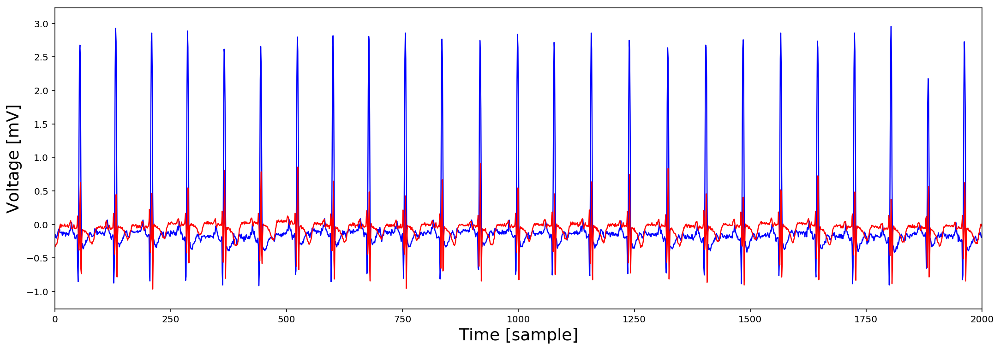

In [5]:
plt.figure(figsize=(18,6))
plt.plot(x[:,0], c='blue')
plt.plot(x[:,1], c='red')
plt.ylabel("Voltage [mV]")
plt.xlabel("Time [sample]")
plt.xlim([0, 2000])
plt.show()

Notice that there are two signals in this recording. And based on ``sig_name`` and its ``units``, we know that we are plotting voltage against time entry.

Now, we will plot the previous signal with the correct time units.

In [6]:
time = [i/record.fs for i in range(0, len(x))]

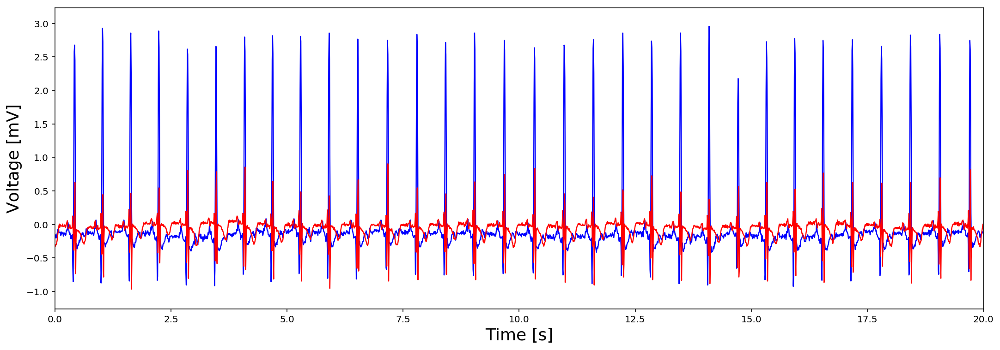

In [7]:
plt.figure(figsize=(18,6))
plt.plot(time, x[:,0], c='blue')
plt.plot(time, x[:,1], c='red')
plt.ylabel("Voltage [mV]")
plt.xlabel("Time [s]")
plt.xlim([0, 20])
plt.show()

# Arrhythmia Database

In [16]:
record = wfdb.rdrecord('100', sampto = 15000)
annotation = wfdb.rdann('100', 'atr', sampto = 15000)

Notice that in the following recording, the function ``plot_wfdb`` is plotting the signal and extracting the R peaks marked by the red crosses.

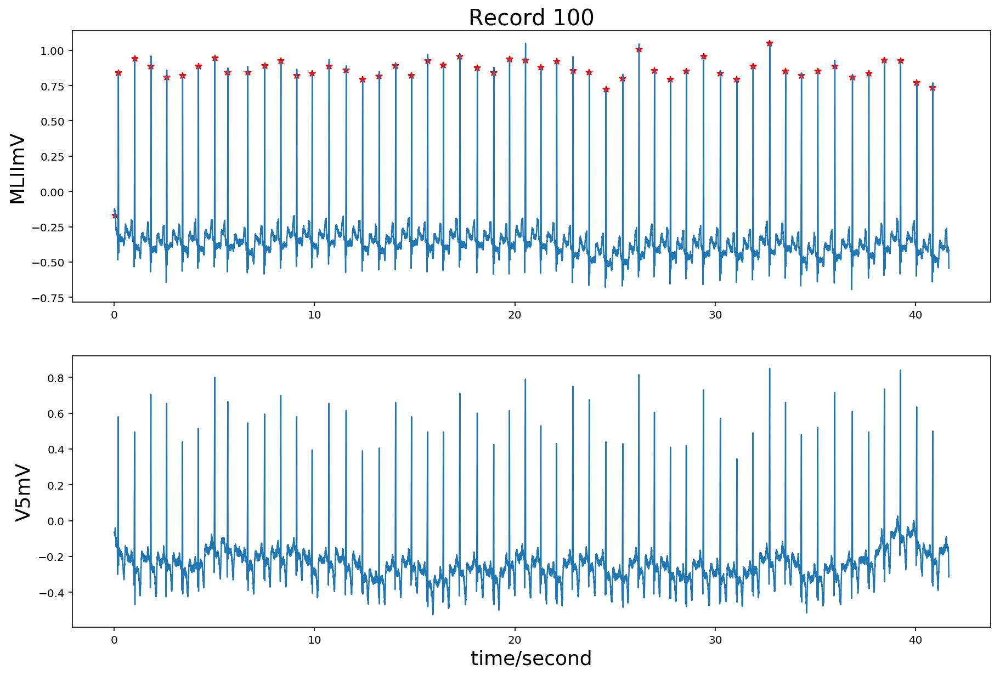

{'record_name': '100',
 'n_sig': 2,
 'fs': 360,
 'counter_freq': None,
 'base_counter': None,
 'sig_len': 15000,
 'base_time': None,
 'base_date': None,
 'comments': ['69 M 1085 1629 x1', 'Aldomet, Inderal'],
 'sig_name': ['MLII', 'V5'],
 'p_signal': array([[-0.145, -0.065],
        [-0.145, -0.065],
        [-0.145, -0.065],
        ...,
        [-0.52 , -0.275],
        [-0.54 , -0.315],
        [-0.545, -0.31 ]]),
 'd_signal': None,
 'e_p_signal': None,
 'e_d_signal': None,
 'file_name': ['100.dat', '100.dat'],
 'fmt': ['212', '212'],
 'samps_per_frame': [1, 1],
 'skew': [None, None],
 'byte_offset': [None, None],
 'adc_gain': [200.0, 200.0],
 'baseline': [1024, 1024],
 'units': ['mV', 'mV'],
 'adc_res': [11, 11],
 'adc_zero': [1024, 1024],
 'init_value': [995, 1011],
 'checksum': [36381, 33548],
 'block_size': [0, 0]}

In [17]:
#plots
wfdb.plot_wfdb(record=record,annotation=annotation,title='Record 100',time_units='seconds',
               figsize=(15,10))

#displays dictionary
display(record.__dict__)

Notice that all the available information is again in the dictionary. Now ``fs`` is different than in the previous recording. The signal's name in this case is 'MLII' and 'V5', and both units are in mV, so both of them must be measuring voltage. Nevertheless, it could be the case that they are actually the same signal, where one removes the movement artifacts.

Saving the ECG signal as ``x``. 

In [18]:
x = record.p_signal

Plotting ``x``.

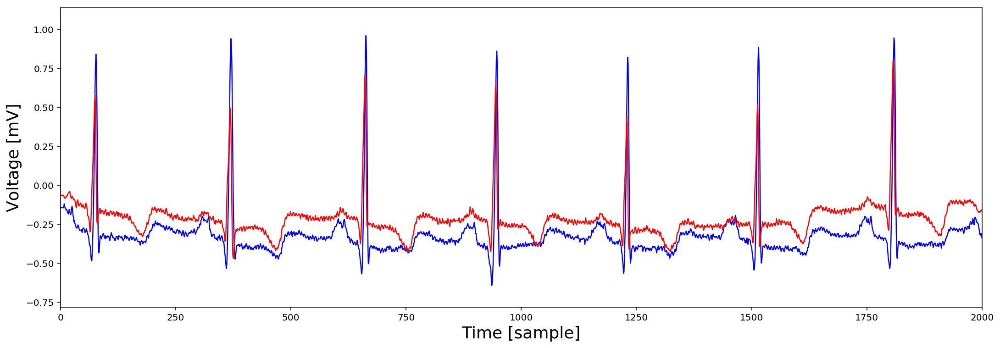

In [19]:
plt.figure(figsize=(18,6))
plt.plot(x[:,0], c='blue')
plt.plot(x[:,1], c='red')
plt.ylabel("Voltage [mV]")
plt.xlabel("Time [sample]")
plt.xlim([0, 2000])
plt.show()

Now, we will plot the previous signal with the correct time units.

In [20]:
time = [i/record.fs for i in range(0, len(x))]

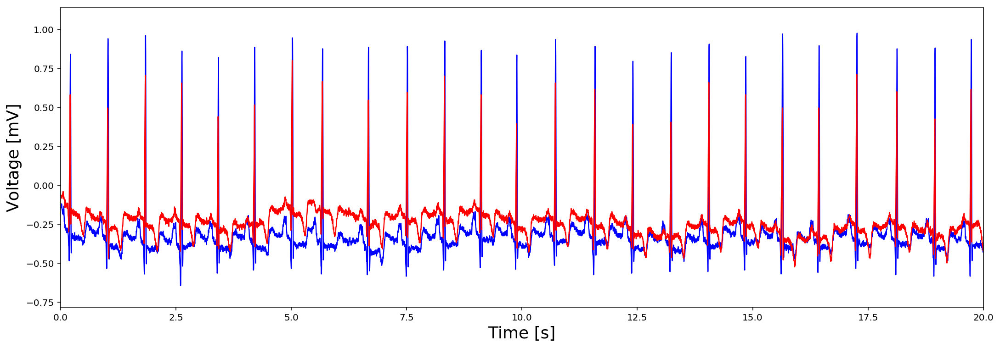

In [23]:
plt.figure(figsize=(18,6))
plt.plot(time, x[:,0], c='blue')
plt.plot(time, x[:,1], c='red')
plt.ylabel("Voltage [mV]")
plt.xlabel("Time [s]")
plt.xlim([0, 20])
plt.show()

# Batch processing

For the Normal Database, there are 18 subjects. First, we create a function which given a directory and a certain extension, pulls the file names in this directory with the particular extension.

In [24]:
def loopFiles(path, extension = ".wav"):
    trials = []
    trials_files = []
    
    for filename in os.listdir(path):
        (file, ext) = os.path.splitext(filename)
        
        if ext == extension: 
            complete_file_path = os.path.join(path,file)
            trials.append(complete_file_path)
            trials_files.append(file)
            
    return(trials, trials_files)

For running the batch processing, you do not need to run it in a folder. You could simply create an array with the file names and run the code with it. Simple the variables ``complete_file_path`` and ``file_names`` would be the same. And they would be assigned the value of the array with the file names.

We want to extract the path to every one of these files from the folder where the current notebook is running. If the path to the files is in a parent folder, we are returning to it by ``../``. Notice that if you have never used file paths before, this may become a problem. By simply copying and pasting the folder's directory, it may not work. From the folder where the notebook is running, you must give instructions for moving to the folder where the files are.

['108', '123', '121', '112', '233', '209', '222', '118', '232', '212', '208', '119', '124', '106', '210', '219', '200', '201', '111', '105', '114', '215', '223', '213', '116', '221', '202', '231', '101', '205', '117', '102', '122', '107', '214', '217', '203', '234', '115', '220', '228', '113', '104', '230', '103', '207', '100', '109']


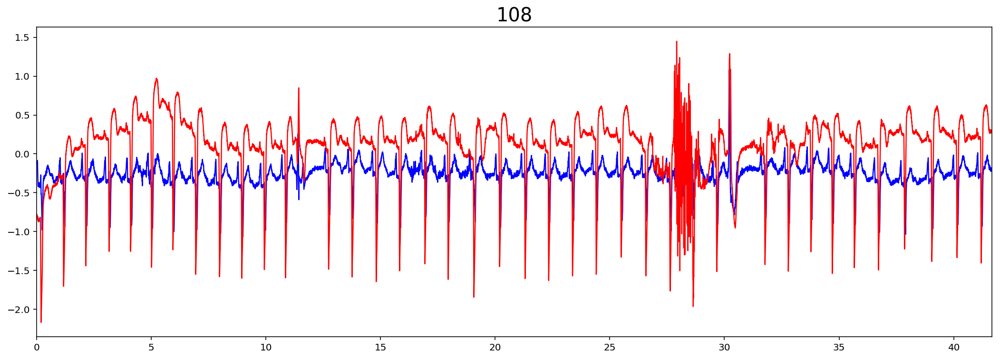

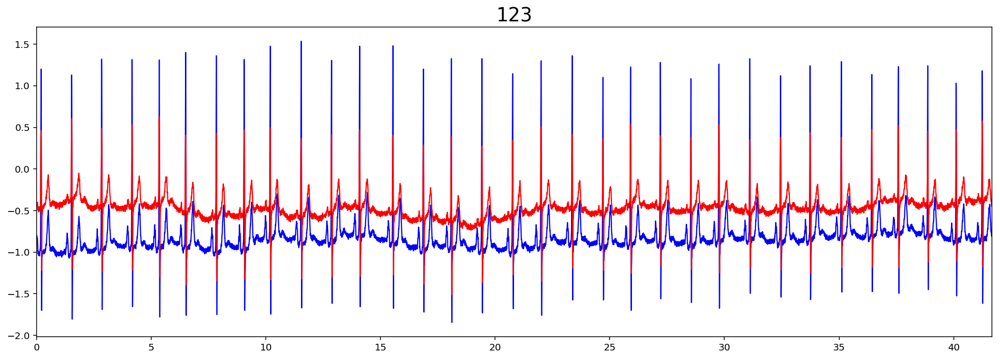

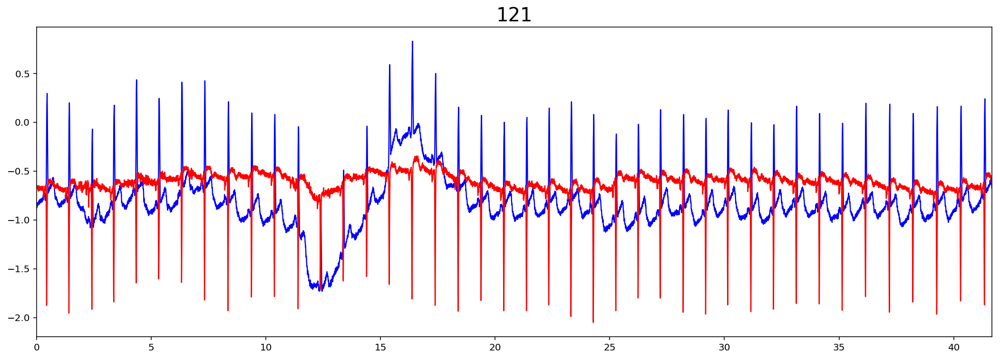

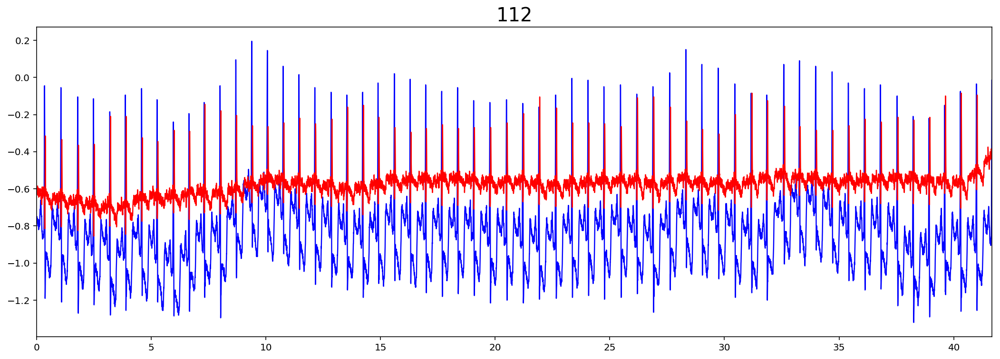

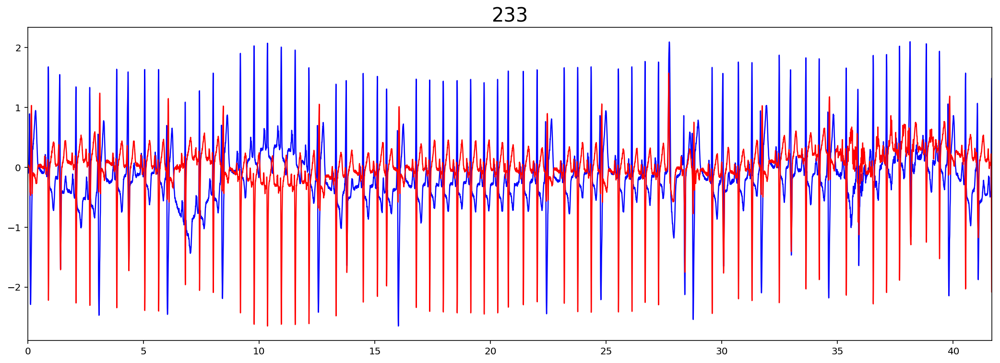

...

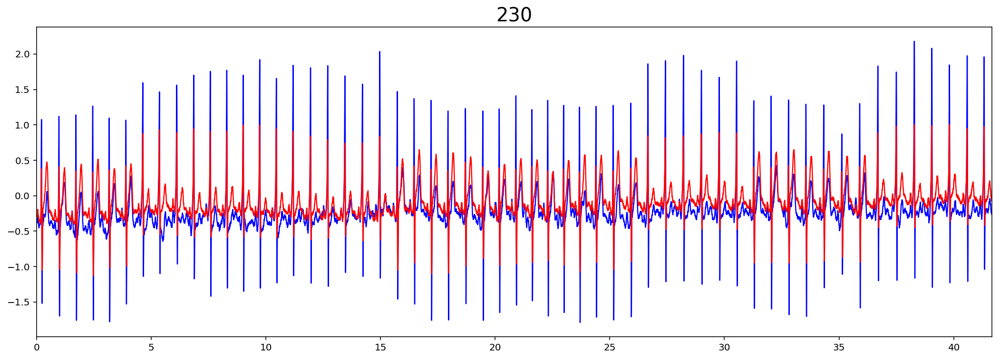

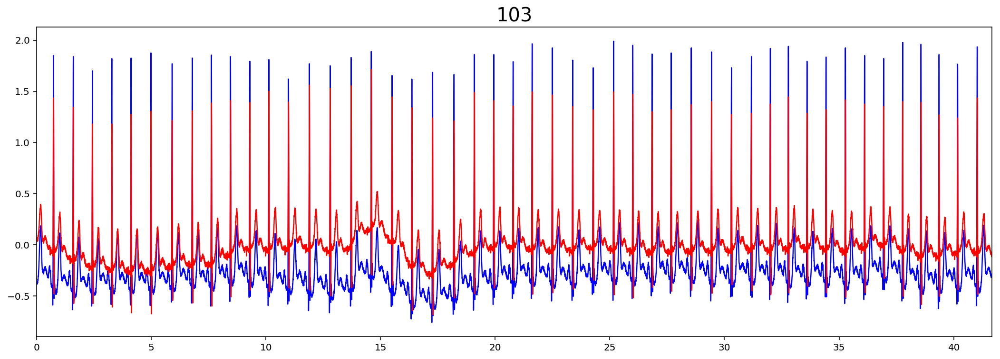

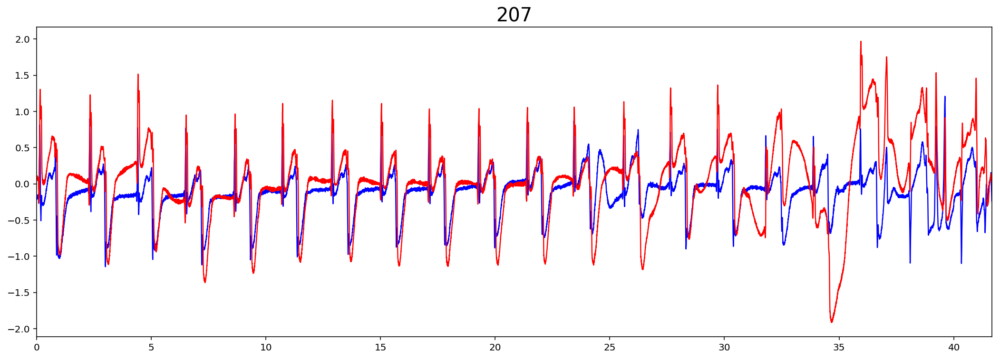

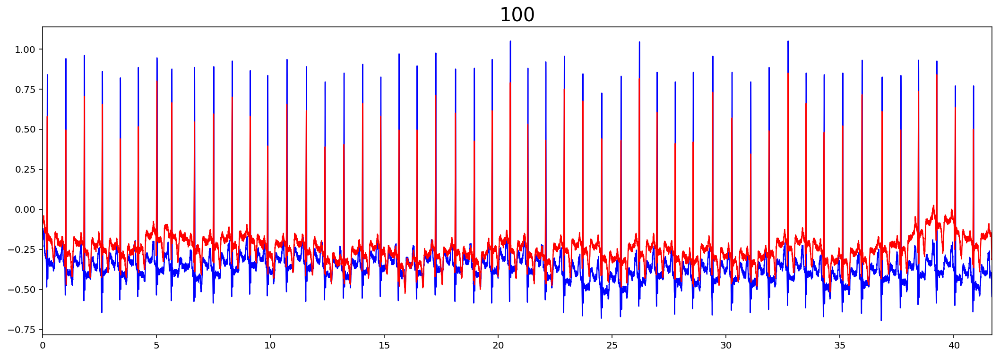

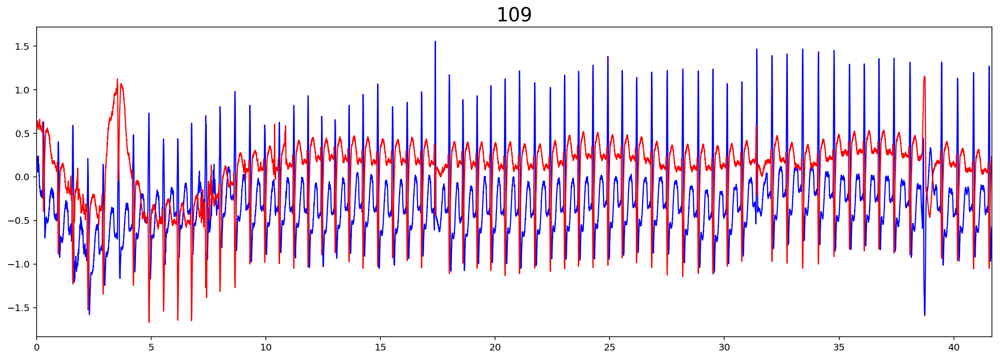

In [25]:
# For running batch processing on the recordings of: MIT-BIH Normal Sinus Rhythm Database
# complete_file_path, file_names = loopFiles('../physionet.org/files/nsrdb/1.0.0/', '.dat')

# For running batch processing on the recordings of: MIT-BIH Arrhythmia Database
complete_file_path, file_names = loopFiles('../physionet.org/files/mitdb/1.0.0', '.dat')

print(file_names)

for i in range(0, len(file_names)):
    record = wfdb.rdrecord(complete_file_path[i], sampto = 15000)

    x = record.p_signal
    time = [i/record.fs for i in range(0, len(x))]    

    plt.figure(figsize=(18,6))
    plt.title(file_names[i])
    plt.plot(time, x[:,0], c='blue')
    plt.plot(time, x[:,1], c='red')
    plt.xlim(time[0], time[len(x)-1])
    plt.show()

# References

[1] Goldberger, A., Amaral, L., Glass, L., Hausdorff, J., Ivanov, P. C., Mark, R., ... & Stanley, H. E. (2000). PhysioBank, PhysioToolkit, and PhysioNet: Components of a new research resource for complex physiologic signals. Circulation [Online]. 101 (23), pp. e215–e220.

[2] Moody GB, Mark RG. The impact of the MIT-BIH Arrhythmia Database. IEEE Eng in Med and Biol 20(3):45-50 (May-June 2001). (PMID: 11446209)

[3] Mohebbi, M., Ghassemian, H., & Asl, B. M. (2011). Structures of the recurrence plot of heart rate variability signal as a tool for predicting the onset of paroxysmal atrial fibrillation. Journal of medical signals and sensors, 1(2), 113.

[4] Parvaneh, S., Hashemi Golpayegani, M. R., Firoozabadi, M., & Haghjoo, M. (2012). Predicting the spontaneous termination of atrial fibrillation based on Poincare section in the electrocardiogram phase space. Proceedings of the Institution of Mechanical Engineers, Part H: Journal of Engineering in Medicine, 226(1), 3-20.

[5] Shekatkar, S. M., Kotriwar, Y., Harikrishnan, K. P., & Ambika, G. (2017). Detecting abnormality in heart dynamics from multifractal analysis of ECG signals. *Scientific reports*, 7(1), 1-11.

[6] Sun, R., & Wang, Y. (2008). Predicting termination of atrial fibrillation based on the structure and quantification of the recurrence plot. Medical engineering & physics, 30(9), 1105-1111.

[7] Yang, H., Bukkapatnam, S. T., & Komanduri, R. (2012). Spatiotemporal representation of cardiac vectorcardiogram (VCG) signals. Biomedical engineering online, 11(1), 16.

[8] Yang, H., Chen, Y., & Leonelli, F. (2016). CHARACTERIZATION AND MONITORING OF NONLINEAR. Healthcare Analytics: From Data to Knowledge to Healthcare Improvement, 59.

[9] Costa, M., Goldberger, A. L., & Peng, C. K. (2002). Multiscale entropy analysis of complex physiologic time series. Physical review letters, 89(6), 068102.

[10] de Figueiredo, J. C. B., & Furuie, S. S. (2001, May). Using statistical distances to detect changes in the normal behavior of ECG-Holter signals. In Medical Imaging 2001: Ultrasonic Imaging and Signal Processing (Vol. 4325, pp. 557-565). International Society for Optics and Photonics.

[11] Hundewale, N. (2012). The application of methods of nonlinear dynamics for ECG in Normal Sinus Rhythm. International Journal of Computer Science Issues (IJCSI), 9(1), 458.

[12] Khandoker, A. H., Karmakar, C., Brennan, M., Palaniswami, M., & Voss, A. (2013). Poincaré plot methods for heart rate variability analysis. Boston, MA, USA: Springer US.

[13] Khadra, L., Fraiwan, A., & Shahab, W. (2002, February). Neural-wavelet analysis of cardiac arrhythmias. In Proceedings of the WSEAS International Conference on Neural Network and Applications (NNA'02) (pp. 3241-3244).

[14] Li, Y., Tang, X., Xu, Z., & Yan, H. (2018). A novel approach to phase space reconstruction of single lead ECG for QRS complex detection. Biomedical Signal Processing and Control, 39, 405-415.

[15] Mewett, D. T., Reynolds, K. J., & Nazeran, H. (1999, August). Recurrence plot features: An example using ECG. In ISSPA'99. Proceedings of the Fifth International Symposium on Signal Processing and its Applications (IEEE Cat. No. 99EX359) (Vol. 1, pp. 175-178). IEEE.